## Project 2 Subway
Jacob Minkin
Last project I tried to predict a critical violation from location and cuisine. The problem is that almost all restaurants have at least one critical violation which made it hard to get any predictive value from the model. Now I want to try again with predicting the score and therefore grade of the restaurant

In [273]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from sklearn.impute import KNNImputer
sns.set_style('darkgrid')

# Import Subway Data
df = pd.read_csv('../data/DOITT_SUBWAY_ENTRANCE_01_13SEPT2010.csv')


In [274]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1928 entries, 0 to 1927
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   OBJECTID  1928 non-null   int64 
 1   URL       1928 non-null   object
 2   NAME      1899 non-null   object
 3   the_geom  1928 non-null   object
 4   LINE      1928 non-null   object
dtypes: int64(1), object(4)
memory usage: 75.4+ KB


In [275]:
string = "POINT (-73.8728919997833 40.84145300067447)"
numbers = string.split("(")[1].split(")")[0]
longitude, latitude = numbers.split()
longitude
latitude

'40.84145300067447'

In [276]:
df['the_geom'].str.split('(', expand=True)[1].str.split(" ")

0        [-73.86835600032798, 40.84916900104506)]
1        [-73.86821300022677, 40.84912800131844)]
2        [-73.87349900050798, 40.84122300105249)]
3         [-73.8728919997833, 40.84145300067447)]
4        [-73.87962300013866, 40.84081500075867)]
                          ...                    
1923     [-73.95281423699555, 40.77618770946792)]
1924    [-73.94747299691045, 40.784098884955554)]
1925    [-73.94761889814153, 40.783916088309326)]
1926     [-73.94772938539093, 40.78292438898596)]
1927     [-73.94823792460468, 40.78296690878563)]
Name: 1, Length: 1928, dtype: object

In [277]:
long = df['the_geom'].str.split('(', expand=True)[1].str.split(" ")
split = pd.DataFrame(long.to_list(), columns=['longitude', 'latitude'])
df = pd.concat([df, split], axis=1)

df['longitude'] = pd.to_numeric(df['longitude'])
df['latitude'] = df['latitude'].str.split(')', expand=True)[0]
df['latitude'] = pd.to_numeric(df['latitude'])
print(df[['longitude', 'latitude']].head(10))

   longitude   latitude
0 -73.868356  40.849169
1 -73.868213  40.849128
2 -73.873499  40.841223
3 -73.872892  40.841453
4 -73.879623  40.840815
5 -73.880005  40.840434
6 -73.879833  40.840354
7 -73.879555  40.840639
8 -73.879397  40.841078
9 -73.888048  40.837325


In [278]:
drop_list = ['OBJECTID', 'URL', 'the_geom', 'NAME']
df.drop(drop_list, axis=1, inplace= True)

In [279]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1928 entries, 0 to 1927
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   LINE       1928 non-null   object 
 1   longitude  1928 non-null   float64
 2   latitude   1928 non-null   float64
dtypes: float64(2), object(1)
memory usage: 45.3+ KB


In [280]:
df[['longitude', 'latitude']]

,longitude,latitude
0,-73.868356,40.849169
1,-73.868213,40.849128
2,-73.873499,40.841223
3,-73.872892,40.841453
4,-73.879623,40.840815
...,...,...
1923,-73.952814,40.776188
1924,-73.947473,40.784099
1925,-73.947619,40.783916
1926,-73.947729,40.782924


In [281]:
df_filtered = df[(df['longitude'] > -74) & (df['longitude'] < -73) & (df['latitude'] > 40.6829) & (df['latitude'] < 40.8746)]

In [282]:
df_filtered.LINE.value_counts().head(25)

6                        113
1                         81
7                         68
F                         66
2-5                       52
L                         46
B-D                       44
G                         44
M-R                       42
A                         35
B-C                       29
4                         26
N-R                       24
A-C-E-N-Q-R-S-1-2-3-7     22
N-Q-R                     22
C                         22
C-E                       21
1-2-3                     21
2-3                       21
N-Q                       20
A-C-F-R                   20
J-Z                       19
F-L-M-1-2-3               17
A-B-C-D-1                 17
GS-4-5-6-7                16
Name: LINE, dtype: int64

In [283]:
df_filtered['LINE'] = df_filtered['LINE'].apply(lambda x: x.split('-'))

print(df_filtered)

        LINE  longitude   latitude
0     [2, 5] -73.868356  40.849169
1     [2, 5] -73.868213  40.849128
2     [2, 5] -73.873499  40.841223
3     [2, 5] -73.872892  40.841453
4     [2, 5] -73.879623  40.840815
...      ...        ...        ...
1923     [Q] -73.952814  40.776188
1924     [Q] -73.947473  40.784099
1925     [Q] -73.947619  40.783916
1926     [Q] -73.947729  40.782924
1927     [Q] -73.948238  40.782967

[1268 rows x 3 columns]


C:\Users\logic_switch\AppData\Local\Temp\ipykernel_34076\107525802.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['LINE'] = df_filtered['LINE'].apply(lambda x: x.split('-'))


In [284]:
df_filtered.LINE.value_counts()

[6]                                   113
[1]                                    81
[7]                                    68
[F]                                    66
[2, 5]                                 52
                                     ... 
[D]                                     2
[N, Q, 7]                               2
[B, D, N, Q, R, 2, 3, 4, 5]             1
[e, F, M, R]                            1
[A, C, E, N, Q, R, GS, 1, 2, 3, 7]      1
Name: LINE, Length: 74, dtype: int64

In [285]:
unique_values = df_filtered['LINE'].explode()
unique_values.value_counts()

M     212
R     211
F     204
6     193
B     182
C     174
1     162
2     162
D     157
E     141
5     139
7     137
A     137
N     133
Q     127
4     125
3     111
L      84
J      73
G      65
Z      52
S      22
GS     17
B       8
e       1
Name: LINE, dtype: int64

In [286]:
df_filtered['LINE'] = df_filtered['LINE'].apply(lambda x: [i.upper().replace('GS', 'G').replace('FS', 'F').replace('B ', 'B') for i in x])


C:\Users\logic_switch\AppData\Local\Temp\ipykernel_34076\3948961350.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['LINE'] = df_filtered['LINE'].apply(lambda x: [i.upper().replace('GS', 'G').replace('FS', 'F').replace('B ', 'B') for i in x])


In [287]:
unique_values = df_filtered['LINE'].explode()
unique_values.value_counts()

M    212
R    211
F    204
6    193
B    190
C    174
1    162
2    162
D    157
E    142
5    139
A    137
7    137
N    133
Q    127
4    125
3    111
L     84
G     82
J     73
Z     52
S     22
Name: LINE, dtype: int64

In [288]:
df_filtered

,LINE,longitude,latitude
0,"[2, 5]",-73.868356,40.849169
1,"[2, 5]",-73.868213,40.849128
2,"[2, 5]",-73.873499,40.841223
3,"[2, 5]",-73.872892,40.841453
4,"[2, 5]",-73.879623,40.840815
...,...,...,...
1923,[Q],-73.952814,40.776188
1924,[Q],-73.947473,40.784099
1925,[Q],-73.947619,40.783916
1926,[Q],-73.947729,40.782924


In [289]:
point = (41.341, -73.832356)

distance_list = ((df_filtered['latitude'] - point[0])**2 + (df_filtered['longitude'] - point[1])**2)**0.5

closest_row = df_filtered.loc[distance_list.idxmin()]

print(closest_row)

LINE               [D]
longitude   -73.877533
latitude     40.874262
Name: 591, dtype: object


In [290]:
dis_list =  ((df_filtered['latitude'] - point[0])**2 + (df_filtered['longitude'] - point[1])**2)**0.5
dis_list.min()

0.4689193123480104

In [291]:
df_filtered['latitude']

0       40.849169
1       40.849128
2       40.841223
3       40.841453
4       40.840815
          ...    
1923    40.776188
1924    40.784099
1925    40.783916
1926    40.782924
1927    40.782967
Name: latitude, Length: 1268, dtype: float64

In [292]:
(df_filtered['latitude'] - point[0])**2

0       0.241898
1       0.241938
2       0.249777
3       0.249547
4       0.250185
          ...   
1923    0.319013
1924    0.310139
1925    0.310342
1926    0.311448
1927    0.311401
Name: latitude, Length: 1268, dtype: float64

In [293]:
df_filtered

,LINE,longitude,latitude
0,"[2, 5]",-73.868356,40.849169
1,"[2, 5]",-73.868213,40.849128
2,"[2, 5]",-73.873499,40.841223
3,"[2, 5]",-73.872892,40.841453
4,"[2, 5]",-73.879623,40.840815
...,...,...,...
1923,[Q],-73.952814,40.776188
1924,[Q],-73.947473,40.784099
1925,[Q],-73.947619,40.783916
1926,[Q],-73.947729,40.782924


In [296]:
df_filtered.to_csv('../data/Subway_Distances.csv', index=False)

In [299]:
fp = "../data/base_map/geo_export_68048701-5e7b-45e0-ac1c-85b45c057d6d.shp"
map_data = gpd.read_file(fp)

In [298]:
gdf = gpd.GeoDataFrame(
    df_filtered, geometry=gpd.points_from_xy(df_filtered.longitude, df_filtered.latitude)) 

Text(0.5, 1.0, 'New York City Restaurants')

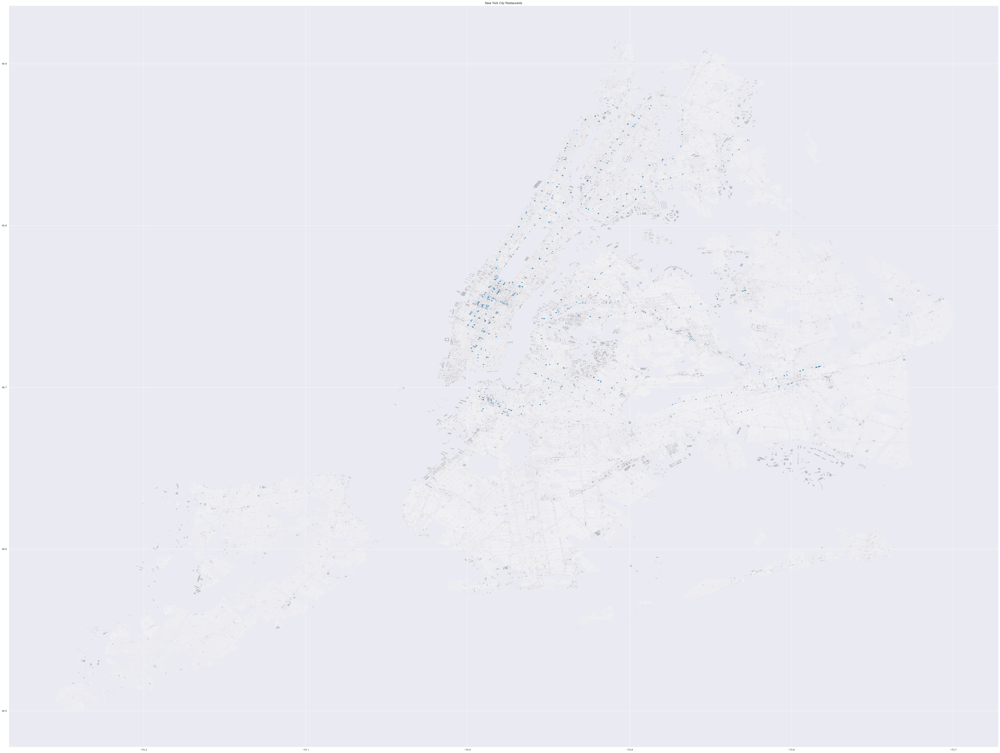

In [300]:
fig, ax = plt.subplots(figsize=(68, 80))

map_data.plot(ax=ax, color="grey", alpha=0.4)

gdf.plot(ax=ax, markersize=2, marker="o", legend= True)

plt.title("New York City Subway Entrances")